## Training on complete 43 clases with complete data

In [4]:
# Install the library
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.1 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 87.3 MB/s eta 0:00:00:00:0100:01


In [2]:
import os
import shutil
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration (Corrected with all 43 classes) ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
YOLO_DATASET_PATH = '/kaggle/working/yolo_airport_dataset' # Final destination

# --- THE FIX: Using the complete and correct list of 43 classes from your file ---
CLASS_NAMES = [
    'Airside Safety Vehicle', 'Ambulance Vehicle', 'Business Jet', 'Cargo Airplane',
    'Cleaning Vehicle', 'Common Aircraft', 'Container Trolley', 'Container Trolley Type A',
    'Container Trolley Type B', 'Container Trolley Type C', 'Conveyer Vehicle', 'Fire Truck',
    'Forklift', 'Helicopter', 'Loading Ramp', 'Loading Vehicle', 'Other Objects',
    'Other Vehicles', 'Passenger Bus', 'Passenger Jet', 'Passenger Stairway',
    'Pedestrian Crossing', 'Person Wearing Reflective Vests', 'Rescue Helicopter',
    'Sanitary Truck', 'Snowplow', 'Speed Limit 30', 'Standard Car', 'Standard Truck',
    'Tank Truck', 'Taxiing Vehicle', 'Tow Vehicle', 'Tractor', 'Traffic Barrier',
    'Traffic Cone', 'Traffic Cone - Off', 'Traffic Cone - On', 'Traffic Cone - Standard',
    'Traffic Sign', 'Transport Container', 'Transport Vehicle', 'Warning Sign', 'Person'
]
NUM_CLASSES = len(CLASS_NAMES)

# --- Data Splitting & Conversion Logic ---

# Clean up any previous attempts
if os.path.exists(YOLO_DATASET_PATH):
    shutil.rmtree(YOLO_DATASET_PATH)

def process_data_split(image_filenames, data_split):
    images_dest_dir = os.path.join(YOLO_DATASET_PATH, 'images', data_split)
    labels_dest_dir = os.path.join(YOLO_DATASET_PATH, 'labels', data_split)
    os.makedirs(images_dest_dir, exist_ok=True)
    os.makedirs(labels_dest_dir, exist_ok=True)
    
    print(f"Processing {data_split} data...")
    for img_file in tqdm(image_filenames):
        # Copy the image file to the new directory
        shutil.copy(os.path.join(IMAGES_PATH, img_file), images_dest_dir)
        
        # Find the corresponding annotation file
        bbox_file = os.path.splitext(img_file)[0] + '.csv'
        bbox_path = os.path.join(BBOXES_PATH, bbox_file)
        
        if os.path.exists(bbox_path):
            try:
                # Get image dimensions
                with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                    img_w, img_h = img.size
                
                # Read CSV and write to YOLO .txt format
                with open(bbox_path, 'r') as f_csv, open(os.path.join(labels_dest_dir, os.path.splitext(img_file)[0] + '.txt'), 'w') as f_txt:
                    reader = csv.DictReader(f_csv)
                    for row in reader:
                        class_id = int(row['label'])
                        
                        # Check if the class_id is valid
                        if 0 <= class_id < NUM_CLASSES:
                            x_min, y_min = float(row['tlx']), float(row['tly'])
                            x_max, y_max = float(row['brx']), float(row['bry'])
                            
                            w, h = x_max - x_min, y_max - y_min
                            x_center = (x_min + w / 2) / img_w
                            y_center = (y_min + h / 2) / img_h
                            norm_w, norm_h = w / img_w, h / img_h
                            
                            f_txt.write(f"{class_id} {x_center} {y_center} {norm_w} {norm_h}\n")
            except Exception as e:
                print(f"Skipping file {img_file} due to error: {e}")

# Get all image files and split them into train/val sets
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files = all_image_files[:split_index]
val_files = all_image_files[split_index:]

# Run the conversion for both splits
process_data_split(train_files, 'train')
process_data_split(val_files, 'val')

print("\nConversion to YOLO format is complete! ✅")

Processing train data...


  0%|          | 0/7275 [00:00<?, ?it/s]

Processing val data...


  0%|          | 0/809 [00:00<?, ?it/s]


Conversion to YOLO format is complete! ✅


In [3]:
import yaml

# --- Create the YAML Data Structure ---
data_yaml = {
    'path': '/kaggle/working/yolo_airport_dataset',
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES
}

# --- Write the YAML File ---
yaml_path = '/kaggle/working/airport_dataset.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print(f"Final dataset YAML file created at: {yaml_path} ✅")

Final dataset YAML file created at: /kaggle/working/airport_dataset.yaml ✅


In [4]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8m.pt')

# Train the model on your custom data
results = model.train(
    data='/kaggle/working/airport_dataset.yaml',
    epochs=10,
    imgsz=640,
    batch=16,
    name='yolov8m_airport_model'
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Ultralytics 8.3.175 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/airport_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8m_airport_model, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

Overriding model.yaml nc=80 with nc=43

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3336.6±1865.9 MB/s, size: 628.6 KB)


train: Scanning /kaggle/working/yolo_airport_dataset/labels/train... 7275 images, 9 backgrounds, 0 corrupt: 100%|██████████| 7275/7275 [00:05<00:00, 1393.83it/s]

train: /kaggle/working/yolo_airport_dataset/images/train/aut-0004-00001996.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-0475-00000675.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-0803-00000297.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-0892-00000705.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-1254-00003226.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-1473-00003250.jpg: 2 duplicate labels removed


train: New cache created: /kaggle/working/yolo_airport_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1737.8±1486.8 MB/s, size: 470.3 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val... 809 images, 3 backgrounds, 0 corrupt: 100%|██████████| 809/809 [00:00<00:00, 1230.55it/s]

val: /kaggle/working/yolo_airport_dataset/images/val/aut-0312-00000373.jpg: 1 duplicate labels removed
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/yolo_airport_dataset/labels/val.cache


Plotting labels to runs/detect/yolov8m_airport_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000213, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_airport_model
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.27G      1.544      2.086      1.205        162        640: 100%|██████████| 455/455 [03:54<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:09<00:00,  2.73it/s]


                   all        809      13914      0.645      0.208      0.218      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.62G      1.395      1.228      1.134        154        640: 100%|██████████| 455/455 [03:53<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.12it/s]


                   all        809      13914      0.591      0.264      0.292      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.68G      1.362      1.103      1.121        155        640: 100%|██████████| 455/455 [03:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


                   all        809      13914      0.651       0.29      0.339      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.75G      1.323      1.022      1.101        163        640: 100%|██████████| 455/455 [03:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.16it/s]


                   all        809      13914      0.654      0.306      0.352      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.82G      1.286     0.9605      1.082        195        640: 100%|██████████| 455/455 [03:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.17it/s]


                   all        809      13914      0.616      0.356      0.377       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      6.88G      1.249     0.9053      1.065        172        640: 100%|██████████| 455/455 [03:51<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.11it/s]


                   all        809      13914      0.702       0.36      0.388      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.95G      1.221      0.867      1.051        194        640: 100%|██████████| 455/455 [03:51<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.24it/s]


                   all        809      13914      0.727      0.349      0.411      0.255

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      7.11G       1.19     0.8276      1.038        184        640: 100%|██████████| 455/455 [03:51<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.15it/s]


                   all        809      13914      0.687       0.37      0.423      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      7.26G      1.158     0.7914      1.024        133        640: 100%|██████████| 455/455 [03:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.14it/s]


                   all        809      13914      0.718      0.379      0.427      0.266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.38G      1.137     0.7648      1.013        166        640: 100%|██████████| 455/455 [03:51<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.11it/s]


                   all        809      13914      0.702      0.383      0.434      0.271

10 epochs completed in 0.672 hours.
Optimizer stripped from runs/detect/yolov8m_airport_model/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_airport_model/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_airport_model/weights/best.pt...
Ultralytics 8.3.175 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,864,657 parameters, 0 gradients, 78.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.33it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809      13914      0.696      0.385      0.434      0.271
Airside Safety Vehicle        100        107      0.712      0.421      0.517      0.333
          Business Jet        403        828      0.658      0.493      0.543      0.302
        Cargo Airplane        391        455      0.766      0.778      0.844      0.645
      Cleaning Vehicle          4         12          1          0    0.00464    0.00186
       Common Aircraft        165        298      0.604      0.107      0.241      0.125
     Container Trolley         27         63          1          0     0.0185    0.00635
Container Trolley Type A        490       2394      0.652      0.519      0.564       0.31
Container Trolley Type B        290        422      0.735      0.434        0.5      0.297
Container Trolley Type C          8          9          0          0    0.00351    0.00285
      Conveyer Vehicle        128        170      0.585      0.623      0.616       0.34
            Fir

In [5]:
from ultralytics import YOLO

# --- Load Your Trained Model ---
# The best model weights are saved in the 'runs/detect/yolov8m_airport_model/weights/' directory.
model_path = '/kaggle/working/runs/detect/yolov8m_airport_model/weights/best.pt'
model = YOLO(model_path)

# --- Run Validation ---
# This will evaluate the model on the 'val' set defined in your airport_dataset.yaml
print("Starting validation...")
metrics = model.val()

# Print the key metrics
print("\nValidation Metrics:")
print(f"Box mAP50-95: {metrics.box.map}")
print(f"Box mAP50: {metrics.box.map50}")

Starting validation...
Ultralytics 8.3.175 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,864,657 parameters, 0 gradients, 78.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2958.2±1539.0 MB/s, size: 800.3 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 3 backgrounds, 0 corrupt: 100%|██████████| 809/809 [00:00<?, ?it/s]

val: /kaggle/working/yolo_airport_dataset/images/val/aut-0312-00000373.jpg: 1 duplicate labels removed
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:16<00:00,  3.17it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809      13914      0.698      0.385      0.435      0.272
Airside Safety Vehicle        100        107      0.713      0.421      0.518      0.332
          Business Jet        403        828      0.663      0.495      0.545      0.302
        Cargo Airplane        391        455      0.771      0.778      0.842      0.645
      Cleaning Vehicle          4         12          1          0    0.00475     0.0019
       Common Aircraft        165        298      0.625      0.107      0.242      0.126
     Container Trolley         27         63          1          0      0.018    0.00638
Container Trolley Type A        490       2394      0.661      0.518      0.565      0.309
Container Trolley Type B        290        422      0.733       0.43        0.5      0.298
Container Trolley Type C          8          9          0          0    0.00352    0.00285
      Conveyer Vehicle        128        170      0.591      0.628      0.625      0.341
            Fir

Running prediction on 5 sample images...

0: 384x640 2 Container Trolley Type As, 1 Person Wearing Reflective Vests, 1 Standard Car, 20.0ms
1: 384x640 1 Cargo Airplane, 1 Loading Vehicle, 1 Speed Limit 30, 13 Transport Containers, 1 Transport Vehicle, 20.0ms
2: 384x640 3 Container Trolley Type As, 1 Conveyer Vehicle, 2 Passenger Stairways, 2 Standard Cars, 1 Tank Truck, 2 Taxiing Vehicles, 10 Transport Containers, 20.0ms
3: 384x640 1 Airside Safety Vehicle, 1 Business Jet, 1 Helicopter, 1 Standard Car, 20.0ms
4: 384x640 6 Container Trolley Type As, 1 Conveyer Vehicle, 1 Passenger Bus, 1 Passenger Stairway, 20.0ms
Speed: 2.6ms preprocess, 20.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict

Displaying prediction results:


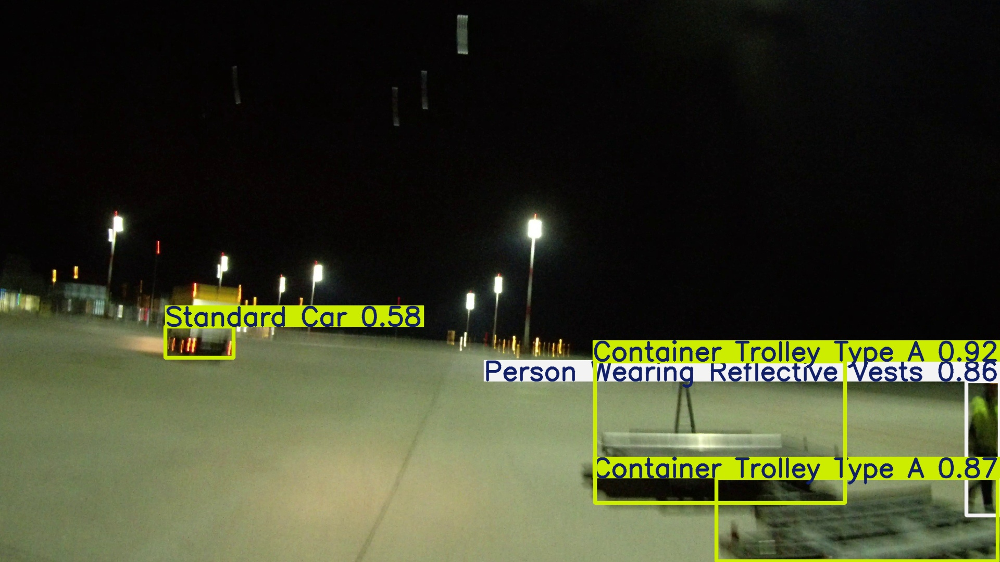

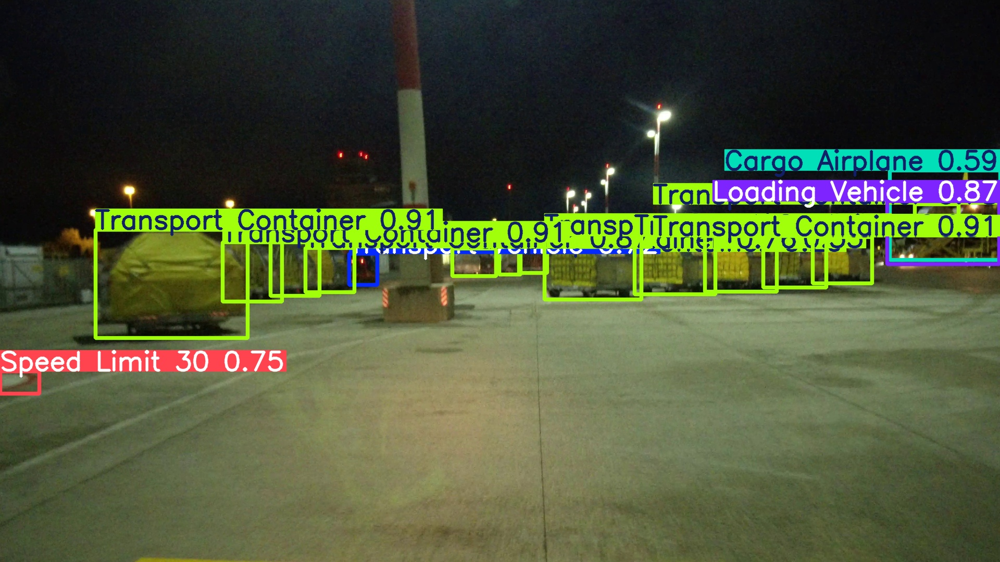

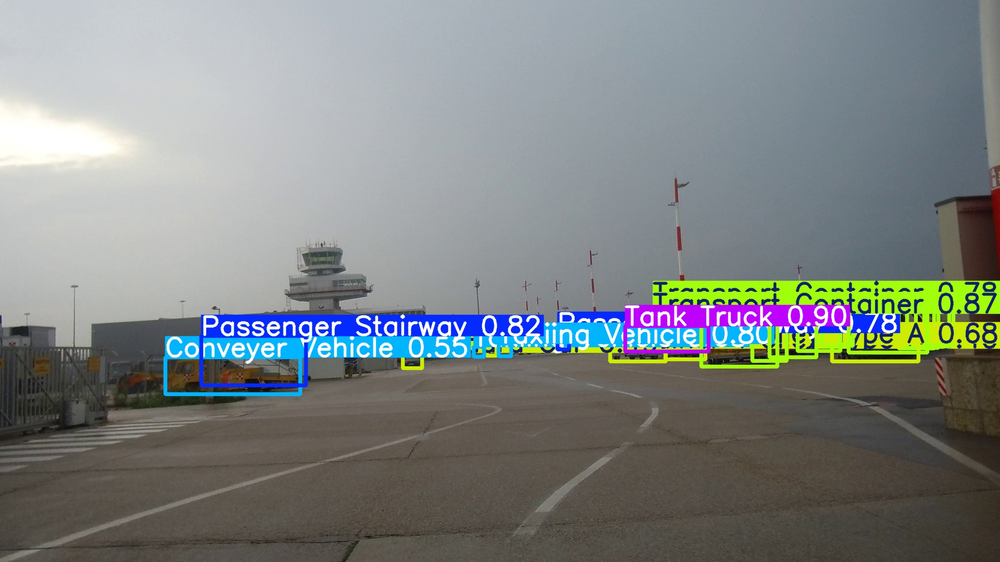

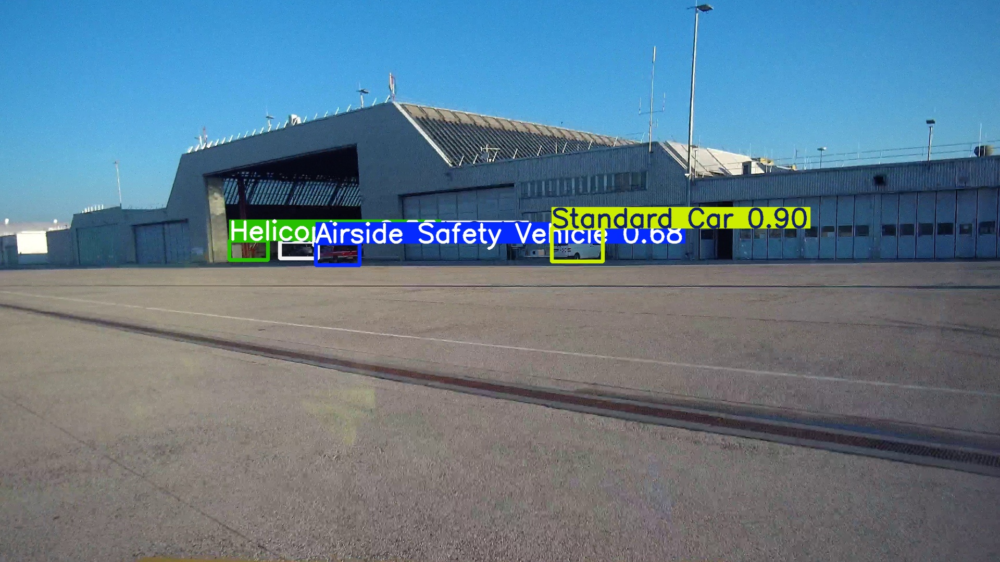

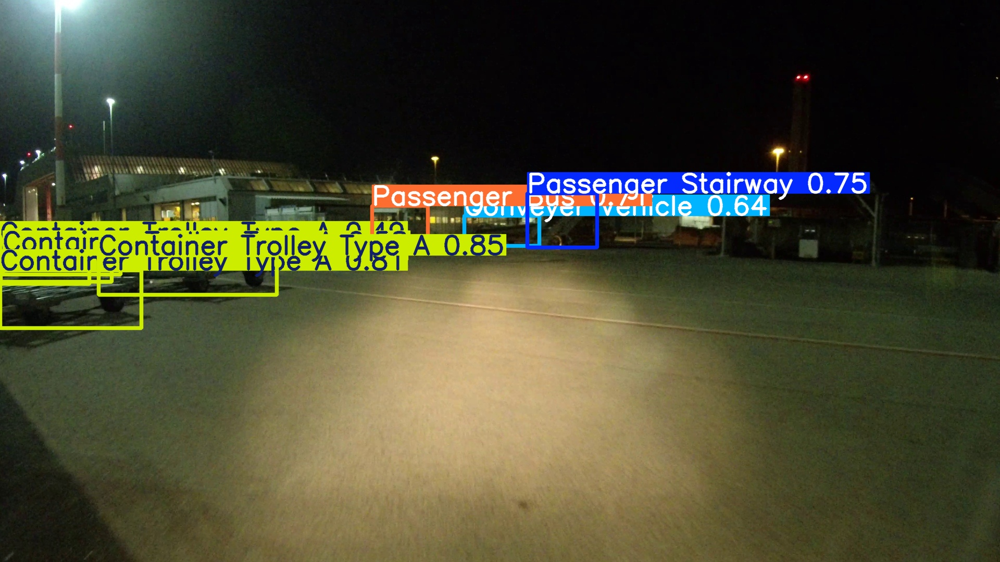

In [6]:
import glob
from IPython.display import Image, display

# --- Run Prediction on a few sample images ---
# Get a list of a few images from your validation set
image_files = glob.glob('/kaggle/working/yolo_airport_dataset/images/val/*.jpg')[:5]

print(f"Running prediction on {len(image_files)} sample images...")
# The 'save=True' argument tells YOLO to save the images with bounding boxes drawn on them.
# The results will be saved in a new folder like 'runs/detect/predict/'.
results = model.predict(image_files, save=True)

# --- Display the Results ---
print("\nDisplaying prediction results:")
# Find the latest prediction directory
prediction_dir = sorted(glob.glob('runs/detect/predict*'))[-1]

for image_file in os.listdir(prediction_dir):
    if image_file.endswith(('.jpg', '.png')):
        # Display each image with its bounding boxes
        display(Image(filename=os.path.join(prediction_dir, image_file)))

## Training on 6 clases with small dataset

In [1]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 75.7 MB/s eta 0:00:00:00:0100:01


In [2]:
import os
import shutil
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration (Corrected with all 6 classes) ---
IMAGES_PATH = '/kaggle/input/appron-small/JPEGImages'
BBOXES_PATH = '/kaggle/input/appron-small/Annotations'
YOLO_DATASET_PATH = '/kaggle/working/yolo_airport_dataset' # Final destination

# --- THE FIX: Using the complete and correct list of 43 classes from your file ---
CLASS_NAMES = [
    'Airside Safety Vehicle','Ambulance Vehicle','Business Jet',
    'Cargo Airplane','Cleaning Vehicle','Common Aircraft'
]
NUM_CLASSES = len(CLASS_NAMES)

# --- Data Splitting & Conversion Logic ---

# Clean up any previous attempts
if os.path.exists(YOLO_DATASET_PATH):
    shutil.rmtree(YOLO_DATASET_PATH)

def process_data_split(image_filenames, data_split):
    images_dest_dir = os.path.join(YOLO_DATASET_PATH, 'images', data_split)
    labels_dest_dir = os.path.join(YOLO_DATASET_PATH, 'labels', data_split)
    os.makedirs(images_dest_dir, exist_ok=True)
    os.makedirs(labels_dest_dir, exist_ok=True)
    
    print(f"Processing {data_split} data...")
    for img_file in tqdm(image_filenames):
        # Copy the image file to the new directory
        shutil.copy(os.path.join(IMAGES_PATH, img_file), images_dest_dir)
        
        # Find the corresponding annotation file
        bbox_file = os.path.splitext(img_file)[0] + '.csv'
        bbox_path = os.path.join(BBOXES_PATH, bbox_file)
        
        if os.path.exists(bbox_path):
            try:
                # Get image dimensions
                with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                    img_w, img_h = img.size
                
                # Read CSV and write to YOLO .txt format
                with open(bbox_path, 'r') as f_csv, open(os.path.join(labels_dest_dir, os.path.splitext(img_file)[0] + '.txt'), 'w') as f_txt:
                    reader = csv.DictReader(f_csv)
                    for row in reader:
                        class_id = int(row['label'])
                        
                        # Check if the class_id is valid
                        if 0 <= class_id < NUM_CLASSES:
                            x_min, y_min = float(row['tlx']), float(row['tly'])
                            x_max, y_max = float(row['brx']), float(row['bry'])
                            
                            w, h = x_max - x_min, y_max - y_min
                            x_center = (x_min + w / 2) / img_w
                            y_center = (y_min + h / 2) / img_h
                            norm_w, norm_h = w / img_w, h / img_h
                            
                            f_txt.write(f"{class_id} {x_center} {y_center} {norm_w} {norm_h}\n")
            except Exception as e:
                print(f"Skipping file {img_file} due to error: {e}")

# Get all image files and split them into train/val sets
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files = all_image_files[:split_index]
val_files = all_image_files[split_index:]

# Run the conversion for both splits
process_data_split(train_files, 'train')
process_data_split(val_files, 'val')

print("\nConversion to YOLO format is complete! ✅")

Processing train data...


  0%|          | 0/90 [00:00<?, ?it/s]

Processing val data...


  0%|          | 0/10 [00:00<?, ?it/s]


Conversion to YOLO format is complete! ✅


In [4]:
import yaml

# --- Create the YAML Data Structure ---
data_yaml = {
    'path': '/kaggle/working/yolo_airport_dataset',
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES
}

# --- Write the YAML File ---
yaml_path = '/kaggle/working/airport_dataset.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print(f"Final dataset YAML file created at: {yaml_path} ✅")

Final dataset YAML file created at: /kaggle/working/airport_dataset.yaml ✅


In [5]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8m.pt')

# Train the model on your custom data
results = model.train(
    data='/kaggle/working/airport_dataset.yaml',
    epochs=10,
    imgsz=640,
    batch=16,
    name='yolov8m_airport_model'
)

Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/airport_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8m_airport_model2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tr

Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2271.2±1307.1 MB/s, size: 574.9 KB)


train: Scanning /kaggle/working/yolo_airport_dataset/labels/train... 90 images, 16 backgrounds, 0 corrupt: 100%|██████████| 90/90 [00:00<00:00, 1457.98it/s]

train: New cache created: /kaggle/working/yolo_airport_dataset/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1658.4±1364.9 MB/s, size: 798.3 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val... 10 images, 2 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<00:00, 1363.29it/s]

val: New cache created: /kaggle/working/yolo_airport_dataset/labels/val.cache


Plotting labels to runs/detect/yolov8m_airport_model2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_airport_model2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      6.18G      2.394      8.584      1.799         62        640: 100%|██████████| 6/6 [00:04<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]

                   all         10         39      0.342      0.111     0.0108    0.00841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      6.22G      2.322      7.093      1.718         56        640: 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]

                   all         10         39      0.954      0.145      0.202      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      6.29G      2.281      4.229      1.552         44        640: 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

                   all         10         39      0.881      0.207       0.22      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      6.37G      2.043      3.305      1.412         31        640: 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  7.72it/s]

                   all         10         39      0.736      0.231      0.237      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      6.43G      1.927      2.962      1.398         71        640: 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.38it/s]

                   all         10         39      0.816      0.211      0.267      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       6.5G      1.908      2.606      1.441         68        640: 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  9.73it/s]

                   all         10         39      0.855      0.216      0.316      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      6.65G      1.806      2.481      1.337         35        640: 100%|██████████| 6/6 [00:02<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.37it/s]

                   all         10         39      0.826      0.236      0.437      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      6.78G      1.813      2.298      1.353         39        640: 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.35it/s]

                   all         10         39      0.774      0.267       0.36      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      6.93G      1.737      2.132      1.349         42        640: 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.92it/s]

                   all         10         39      0.761      0.323      0.354      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      7.23G      1.657      1.997      1.294         69        640: 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.94it/s]

                   all         10         39      0.792      0.295      0.351      0.225



10 epochs completed in 0.011 hours.
Optimizer stripped from runs/detect/yolov8m_airport_model2/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_airport_model2/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_airport_model2/weights/best.pt...
Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 10.89it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         10         39      0.826      0.236      0.437      0.258
Airside Safety Vehicle          1          1          1          0      0.995      0.597
     Ambulance Vehicle          4         12      0.583       0.25      0.313      0.109
          Business Jet          6          6      0.622      0.833      0.904      0.624
        Cargo Airplane          2          4          1          0          0          0
      Cleaning Vehicle          1          1          1          0          0          0
       Common Aircraft          4         15      0.751      0.333       0.41      0.216
Speed: 0.2ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/yolov8m_airport_model2


In [7]:
from ultralytics import YOLO

# --- Load Your Trained Model ---
# The best model weights are saved in the 'runs/detect/yolov8m_airport_model/weights/' directory.
model_path = '/kaggle/working/runs/detect/yolov8m_airport_model2/weights/best.pt'
model = YOLO(model_path)

# --- Run Validation ---
# This will evaluate the model on the 'val' set defined in your airport_dataset.yaml
print("Starting validation...")
metrics = model.val()

# Print the key metrics
print("\nValidation Metrics:")
print(f"Box mAP50-95: {metrics.box.map}")
print(f"Box mAP50: {metrics.box.map50}")

Starting validation...
Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3083.6±388.8 MB/s, size: 594.4 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 10 images, 2 backgrounds, 0 corrupt: 100%|██████████| 10/10 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.26it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         10         39      0.825      0.236      0.438      0.259
Airside Safety Vehicle          1          1          1          0      0.995      0.597
     Ambulance Vehicle          4         12       0.58       0.25      0.318      0.115
          Business Jet          6          6      0.621      0.833      0.904      0.624
        Cargo Airplane          2          4          1          0          0          0
      Cleaning Vehicle          1          1          1          0          0          0
       Common Aircraft          4         15      0.751      0.333      0.411      0.217
Speed: 0.2ms preprocess, 19.6ms inference, 0.0ms loss, 2.9ms postprocess per image
Results saved to runs/detect/val

Validation Metrics:
Box mAP50-95: 0.25889143671817255
Box mAP50: 0.4379731488488474


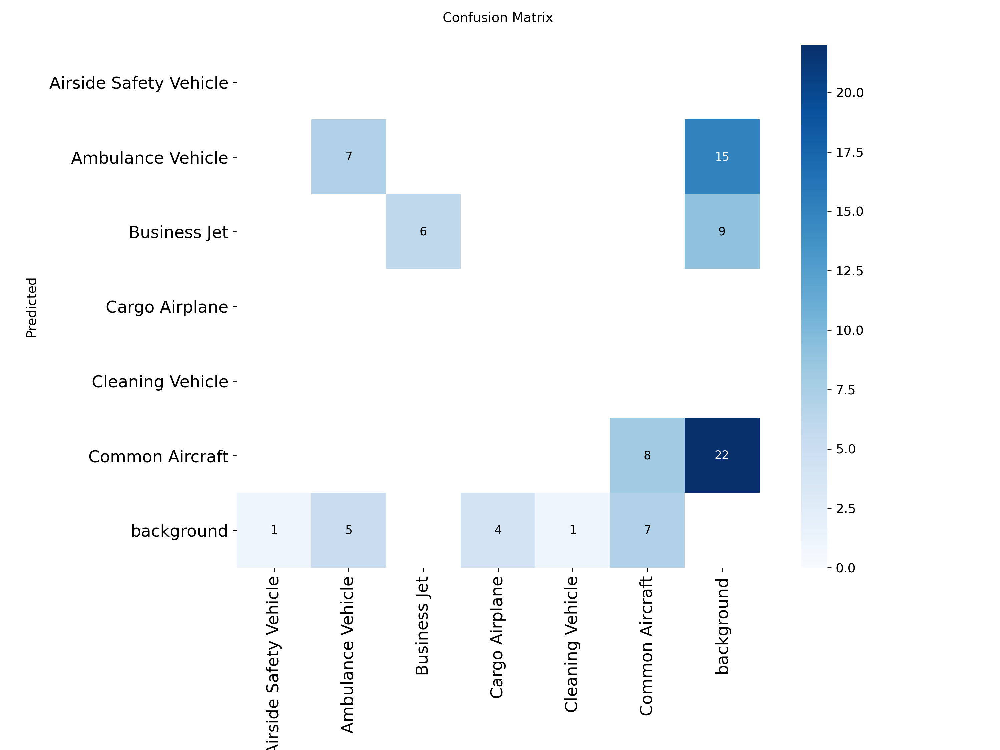

In [24]:
from PIL import Image
from IPython.display import display

img = Image.open("/kaggle/working/runs/detect/yolov8m_airport_model2/confusion_matrix.png")

# Display full-size image in notebook
display(img)


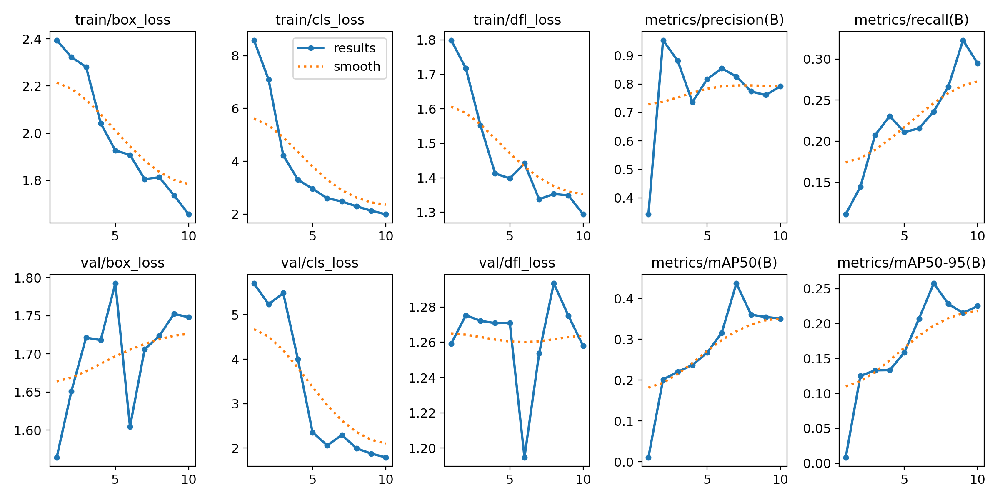

In [23]:
from PIL import Image
from IPython.display import display

img = Image.open("/kaggle/working/runs/detect/yolov8m_airport_model2/results.png")

# Display full-size image in notebook
display(img)


Running prediction on 5 sample images...

0: 384x640 11 Ambulance Vehicles, 20.3ms
1: 384x640 1 Ambulance Vehicle, 20.3ms
2: 384x640 1 Ambulance Vehicle, 2 Business Jets, 1 Common Aircraft, 20.3ms
3: 384x640 3 Business Jets, 21 Common Aircrafts, 20.3ms
4: 384x640 5 Business Jets, 20.3ms
Speed: 2.5ms preprocess, 20.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict

Displaying prediction results:


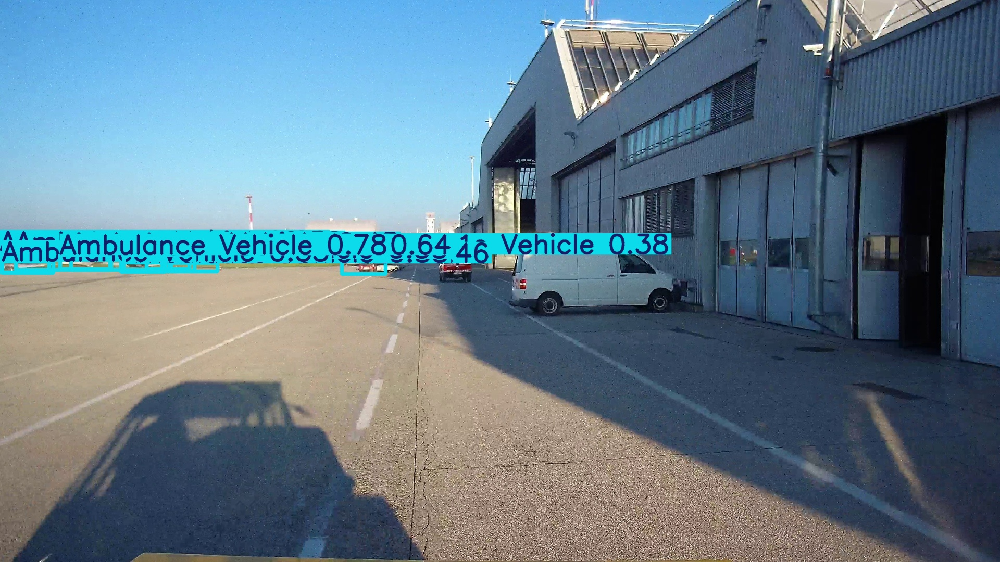

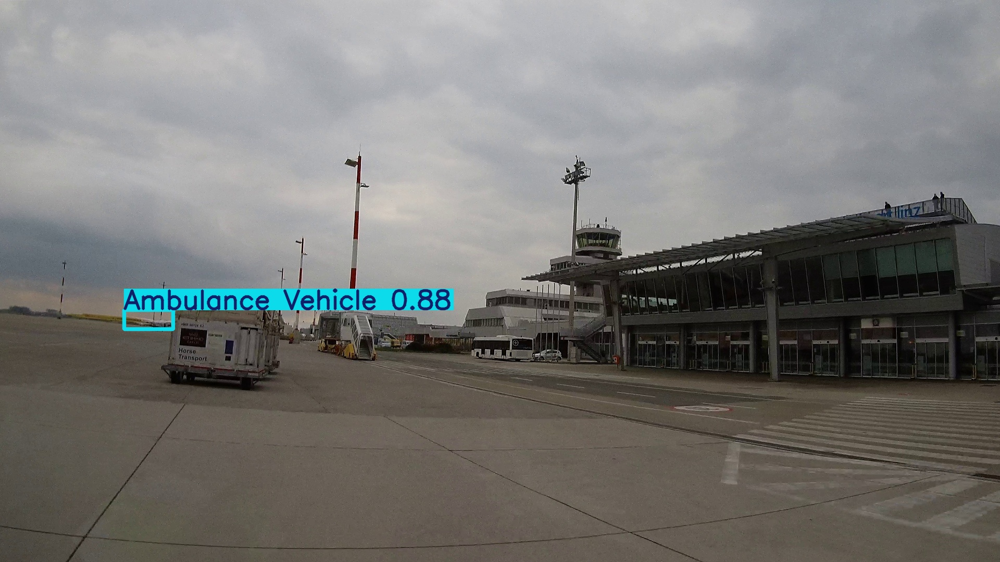

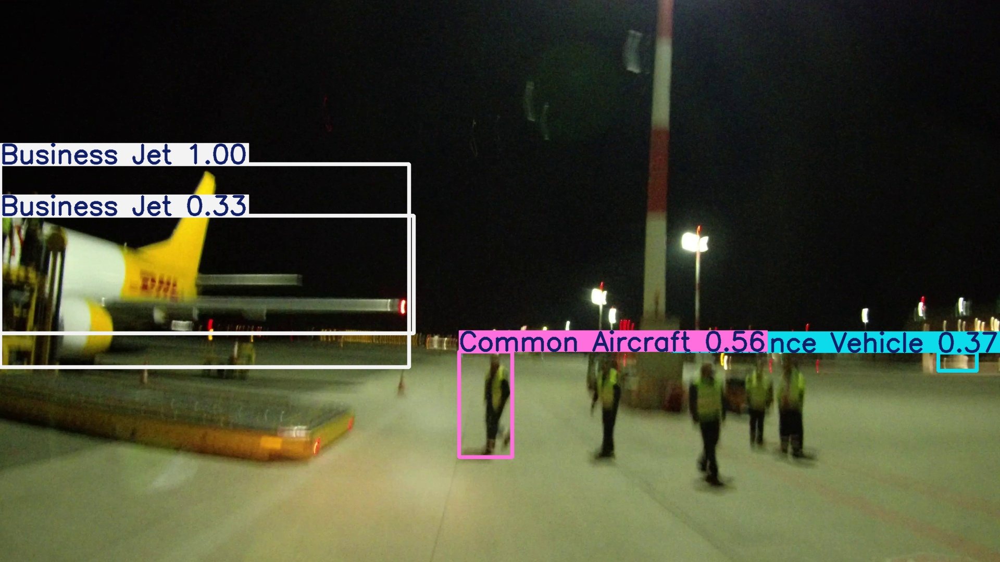

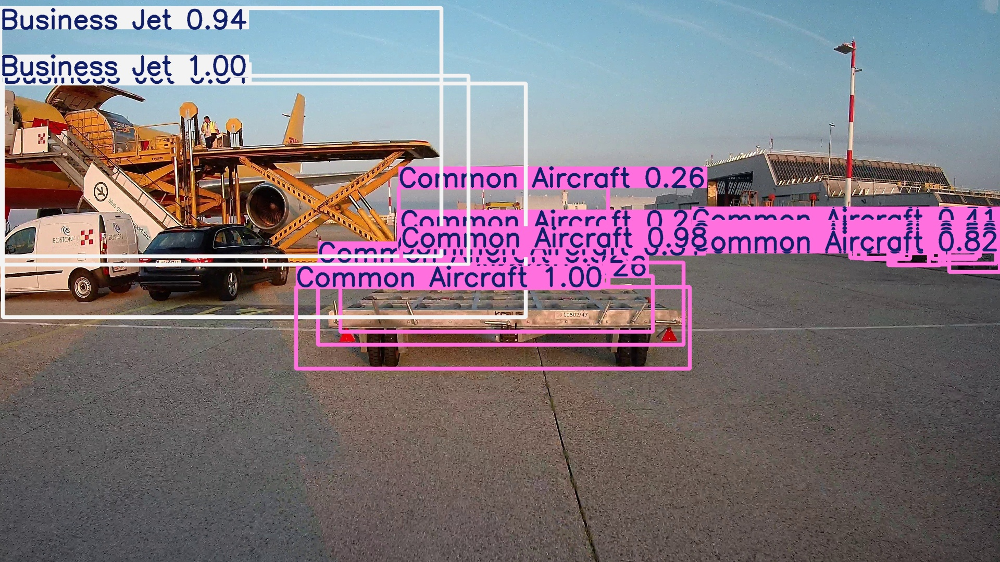

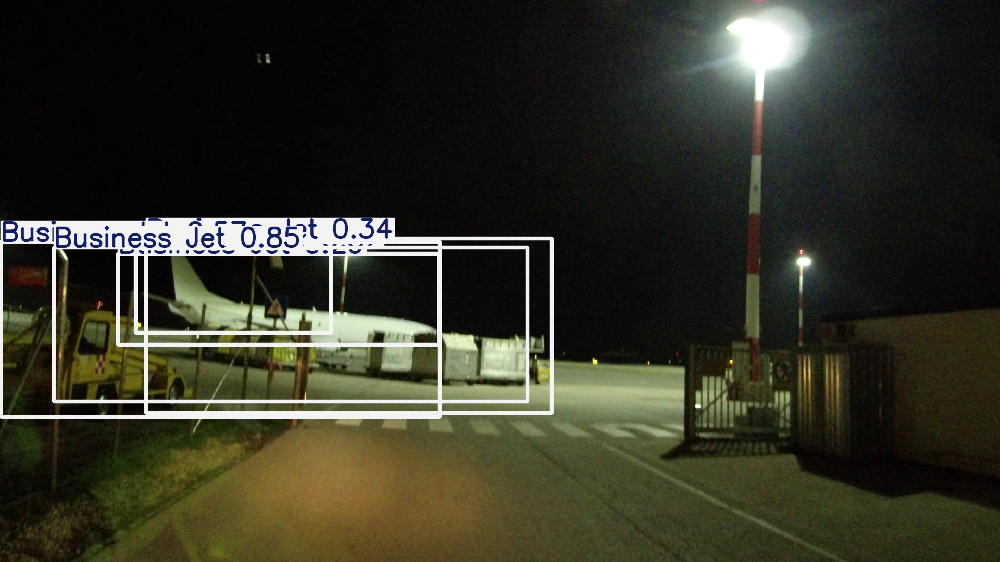

In [8]:
import glob
from IPython.display import Image, display

# --- Run Prediction on a few sample images ---
# Get a list of a few images from your validation set
image_files = glob.glob('/kaggle/working/yolo_airport_dataset/images/val/*.jpg')[:5]

print(f"Running prediction on {len(image_files)} sample images...")
# The 'save=True' argument tells YOLO to save the images with bounding boxes drawn on them.
# The results will be saved in a new folder like 'runs/detect/predict/'.
results = model.predict(image_files, save=True)

# --- Display the Results ---
print("\nDisplaying prediction results:")
# Find the latest prediction directory
prediction_dir = sorted(glob.glob('runs/detect/predict*'))[-1]

for image_file in os.listdir(prediction_dir):
    if image_file.endswith(('.jpg', '.png')):
        # Display each image with its bounding boxes
        display(Image(filename=os.path.join(prediction_dir, image_file)))

## training on 6 clases with complete dataset

In [1]:
import os
import shutil
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration (Corrected with all 6 classes) ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
YOLO_DATASET_PATH = '/kaggle/working/yolo_airport_dataset' # Final destination

# --- THE FIX: Using the complete and correct list of 43 classes from your file ---
CLASS_NAMES = [
    'Airside Safety Vehicle','Ambulance Vehicle','Business Jet',
    'Cargo Airplane','Cleaning Vehicle','Common Aircraft'
]
NUM_CLASSES = len(CLASS_NAMES)

# --- Data Splitting & Conversion Logic ---

# Clean up any previous attempts
if os.path.exists(YOLO_DATASET_PATH):
    shutil.rmtree(YOLO_DATASET_PATH)

def process_data_split(image_filenames, data_split):
    images_dest_dir = os.path.join(YOLO_DATASET_PATH, 'images', data_split)
    labels_dest_dir = os.path.join(YOLO_DATASET_PATH, 'labels', data_split)
    os.makedirs(images_dest_dir, exist_ok=True)
    os.makedirs(labels_dest_dir, exist_ok=True)
    
    print(f"Processing {data_split} data...")
    for img_file in tqdm(image_filenames):
        # Copy the image file to the new directory
        shutil.copy(os.path.join(IMAGES_PATH, img_file), images_dest_dir)
        
        # Find the corresponding annotation file
        bbox_file = os.path.splitext(img_file)[0] + '.csv'
        bbox_path = os.path.join(BBOXES_PATH, bbox_file)
        
        if os.path.exists(bbox_path):
            try:
                # Get image dimensions
                with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                    img_w, img_h = img.size
                
                # Read CSV and write to YOLO .txt format
                with open(bbox_path, 'r') as f_csv, open(os.path.join(labels_dest_dir, os.path.splitext(img_file)[0] + '.txt'), 'w') as f_txt:
                    reader = csv.DictReader(f_csv)
                    for row in reader:
                        class_id = int(row['label'])
                        
                        # Check if the class_id is valid
                        if 0 <= class_id < NUM_CLASSES:
                            x_min, y_min = float(row['tlx']), float(row['tly'])
                            x_max, y_max = float(row['brx']), float(row['bry'])
                            
                            w, h = x_max - x_min, y_max - y_min
                            x_center = (x_min + w / 2) / img_w
                            y_center = (y_min + h / 2) / img_h
                            norm_w, norm_h = w / img_w, h / img_h
                            
                            f_txt.write(f"{class_id} {x_center} {y_center} {norm_w} {norm_h}\n")
            except Exception as e:
                print(f"Skipping file {img_file} due to error: {e}")

# Get all image files and split them into train/val sets
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files = all_image_files[:split_index]
val_files = all_image_files[split_index:]

# Run the conversion for both splits
process_data_split(train_files, 'train')
process_data_split(val_files, 'val')

print("\nConversion to YOLO format is complete! ✅")

Processing train data...


  0%|          | 0/7275 [00:00<?, ?it/s]

Processing val data...


  0%|          | 0/809 [00:00<?, ?it/s]


Conversion to YOLO format is complete! ✅


In [2]:
import yaml

# --- Create the YAML Data Structure ---
data_yaml = {
    'path': '/kaggle/working/yolo_airport_dataset',
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES
}

# --- Write the YAML File ---
yaml_path = '/kaggle/working/airport_dataset.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print(f"Final dataset YAML file created at: {yaml_path} ✅")

Final dataset YAML file created at: /kaggle/working/airport_dataset.yaml ✅


## results before finetuning

In [6]:
from ultralytics import YOLO

# Load the pre-trained model
model = YOLO('yolov8m.pt')

# IMPORTANT: Replace these with the actual indices from your .yaml file!
class_indices_to_evaluate = [0, 1, 2, 3, 4, 5] 

# Get the class names from the model's names dictionary for a nice printout
# This assumes the dataset's names are loaded correctly with the model or dataset config
class_names_to_evaluate = [model.names[i] for i in class_indices_to_evaluate]
print(f"Starting validation on the following {len(class_names_to_evaluate)} classes: {class_names_to_evaluate}")

# Run validation focusing only on the specified classes
results = model.val(
    data='/kaggle/working/airport_dataset.yaml',
    imgsz=640,
    split='val',
    classes=class_indices_to_evaluate, # This is the key argument
    name='yolov8m_specific_class_eval'
)

print("\nValidation complete!")
print("The confusion matrix and all reports in 'runs/detect/yolov8m_specific_class_eval' will now only show results for the selected classes.")

Starting validation on the following 6 classes: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus']
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3069.3±572.8 MB/s, size: 491.4 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 160 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1192686.1it/s 0.0s0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 4.0it/s 12.8s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       1700    0.00285     0.0991    0.00176   0.000811
                person        100        107   0.000748      0.121   0.000421   0.000191
                   car        403        828    0.00663       0.24    0.00456    0.00177
            motorcycle        391        455    0.00499    0.00659    0.00282    0.00163
              airplane          4         12   8.25e-05     0.0833   4.81e-05   3.85e-05
                   bus        165        298    0.00179     0.0436   0.000937   0.000429
Speed: 0.3ms preprocess, 12.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/yolov8m_specific_class_eval

Validation complete!
The confusion matrix and all reports in 'runs/detect/yolov8m_specific_class_eval' will now only show results for the selected classes.


In [7]:
# 'results' is the object returned by model.val() from the first code block

# Get the overall mean precision and mean recall
mean_precision = results.box.mp  # Mean Precision
mean_recall = results.box.mr     # Mean Recall

# Calculate the F1-Score using the formula
if (mean_precision + mean_recall) > 0:
    f1_score = 2 * (mean_precision * mean_recall) / (mean_precision + mean_recall)
else:
    f1_score = 0

print(f"Overall Mean Precision (P): {mean_precision:.4f}")
print(f"Overall Mean Recall (R): {mean_recall:.4f}")
print(f"Overall F1-Score: {f1_score:.4f}")

# You can also check the saved plot 'F1_curve.png' in your runs/detect/val folder

Overall Mean Precision (P): 0.0029
Overall Mean Recall (R): 0.0991
Overall F1-Score: 0.0055


## After Training

In [16]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8m.pt')

# Train the model on your custom data
results = model.train(
    data='/kaggle/working/airport_dataset.yaml',
    epochs=5,
    imgsz=640,
    batch=16,
    name='yolov8m_airport_model'
)

Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/airport_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8m_airport_model4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

train: Scanning /kaggle/working/yolo_airport_dataset/labels/train.cache... 7275 images, 1518 backgrounds, 0 corrupt: 100%|██████████| 7275/7275 [00:00<?, ?it/s]

train: /kaggle/working/yolo_airport_dataset/images/train/aut-0475-00000675.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-0803-00000297.jpg: 1 duplicate labels removed
train: /kaggle/working/yolo_airport_dataset/images/train/aut-1473-00003250.jpg: 1 duplicate labels removed
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 756.5±668.9 MB/s, size: 470.3 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 160 backgrounds, 0 corrupt: 100%|██████████| 809/809 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8m_airport_model4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_airport_model4
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      11.7G      1.627      2.067      1.308         50        640: 100%|██████████| 455/455 [04:19<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.22it/s]


                   all        809       1700      0.342      0.271      0.236       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      11.9G      1.665       1.54      1.317         30        640: 100%|██████████| 455/455 [04:15<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.23it/s]

                   all        809       1700      0.733      0.259       0.29      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      11.9G      1.582      1.446      1.291         44        640: 100%|██████████| 455/455 [04:14<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.34it/s]

                   all        809       1700      0.343      0.318      0.304      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      11.9G      1.473       1.27      1.227         45        640: 100%|██████████| 455/455 [04:13<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.36it/s]

                   all        809       1700      0.417      0.391      0.375      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      11.9G      1.359       1.14      1.179         50        640: 100%|██████████| 455/455 [04:14<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.29it/s]

                   all        809       1700      0.504      0.403      0.411      0.247



5 epochs completed in 0.368 hours.
Optimizer stripped from runs/detect/yolov8m_airport_model4/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_airport_model4/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_airport_model4/weights/best.pt...
Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:08<00:00,  3.04it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       1700      0.507      0.402      0.411      0.247
Airside Safety Vehicle        100        107       0.57      0.533      0.481      0.253
          Business Jet        403        828      0.507      0.597      0.539      0.288
        Cargo Airplane        391        455      0.676      0.811       0.83      0.598
      Cleaning Vehicle          4         12          0          0          0          0
       Common Aircraft        165        298      0.783     0.0705      0.205      0.097
Speed: 0.1ms preprocess, 6.2ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/yolov8m_airport_model4


In [17]:
from ultralytics import YOLO

# --- Load Your Trained Model ---
# The best model weights are saved in the 'runs/detect/yolov8m_airport_model/weights/' directory.
model_path = '/kaggle/working/runs/detect/yolov8m_airport_model4/weights/best.pt'
model = YOLO(model_path)

# --- Run Validation ---
# This will evaluate the model on the 'val' set defined in your airport_dataset.yaml
print("Starting validation...")
metrics = model.val()

# Print the key metrics
print("\nValidation Metrics:")
print(f"Box mAP50-95: {metrics.box.map}")
print(f"Box mAP50: {metrics.box.map50}")

Starting validation...
Ultralytics 8.3.182 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3411.2±399.0 MB/s, size: 800.3 KB)


val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 160 backgrounds, 0 corrupt: 100%|██████████| 809/809 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:17<00:00,  2.86it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       1700      0.508      0.404       0.41      0.246
Airside Safety Vehicle        100        107      0.575      0.542      0.476      0.252
          Business Jet        403        828      0.507      0.595       0.54      0.287
        Cargo Airplane        391        455      0.676      0.811       0.83      0.598
      Cleaning Vehicle          4         12          0          0          0          0
       Common Aircraft        165        298      0.783     0.0705      0.204     0.0957
Speed: 0.3ms preprocess, 18.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val2

Validation Metrics:
Box mAP50-95: 0.2463604264269431
Box mAP50: 0.41014151478522115


Running prediction on 5 sample images...

0: 384x640 1 Airside Safety Vehicle, 1 Business Jet, 20.1ms
1: 384x640 1 Business Jet, 20.1ms
2: 384x640 1 Business Jet, 20.1ms
3: 384x640 3 Business Jets, 1 Cargo Airplane, 20.1ms
4: 384x640 (no detections), 20.1ms
Speed: 3.3ms preprocess, 20.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs/detect/predict2

Displaying prediction results:


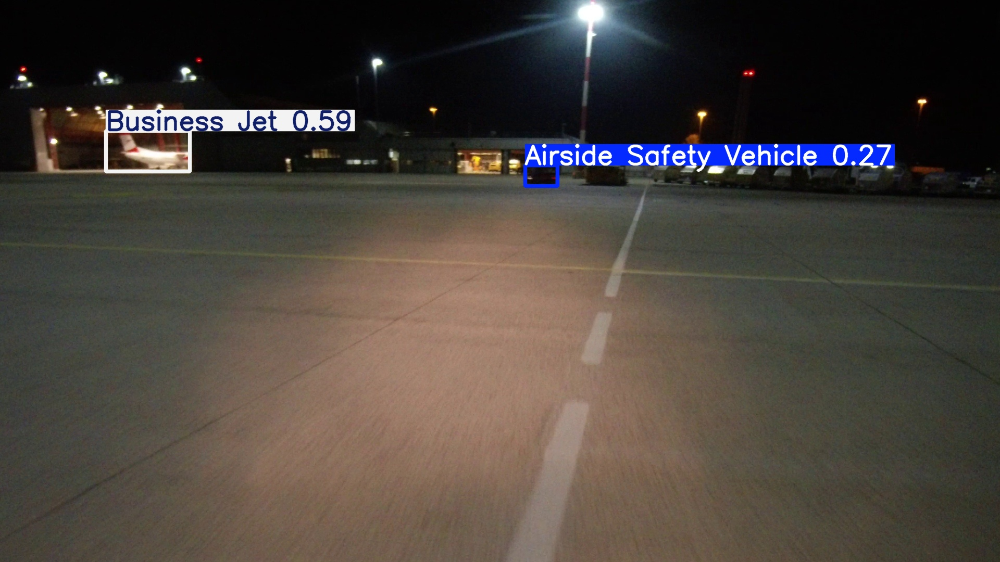

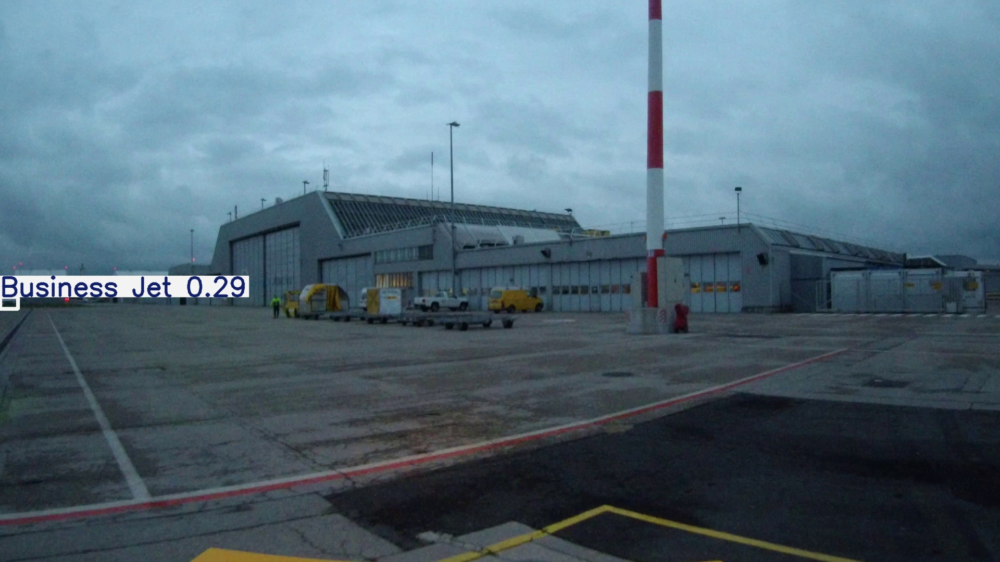

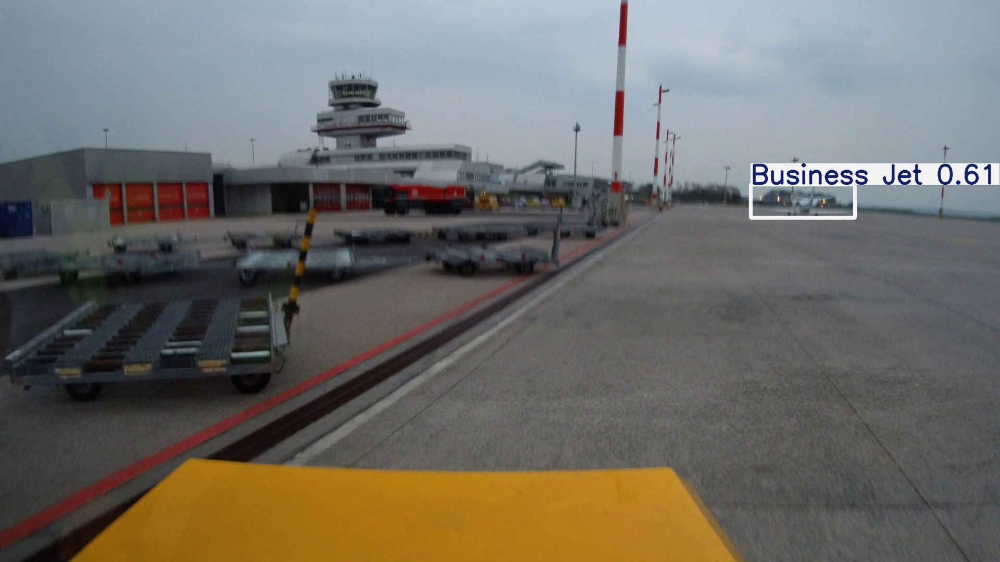

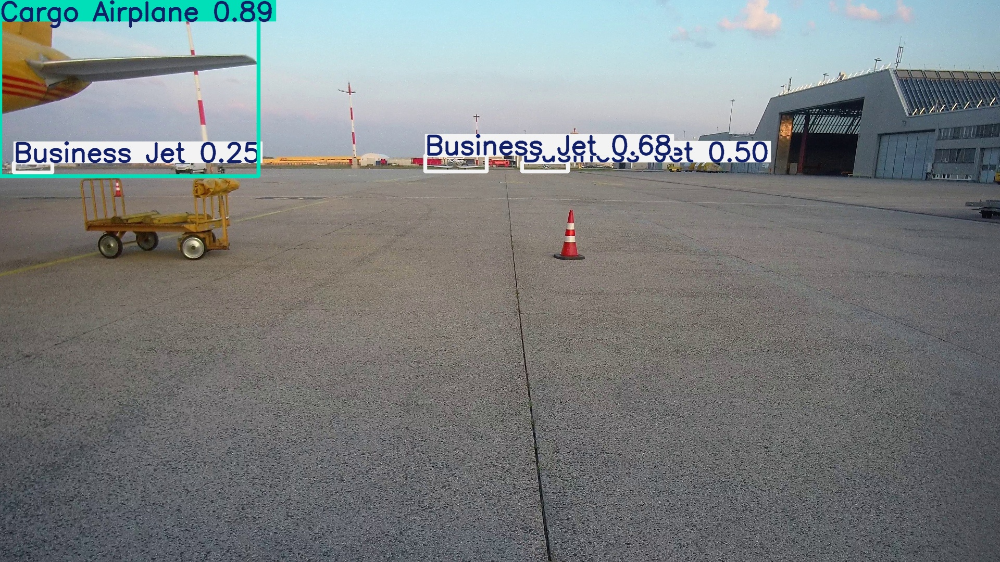

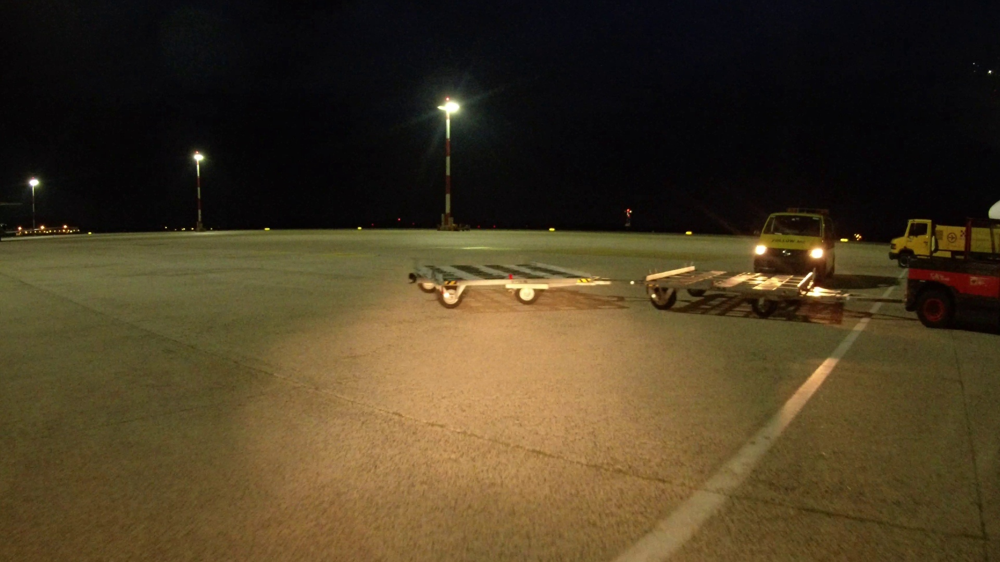

In [18]:
import glob
from IPython.display import Image, display

# --- Run Prediction on a few sample images ---
# Get a list of a few images from your validation set
image_files = glob.glob('/kaggle/working/yolo_airport_dataset/images/val/*.jpg')[:5]

print(f"Running prediction on {len(image_files)} sample images...")
# The 'save=True' argument tells YOLO to save the images with bounding boxes drawn on them.
# The results will be saved in a new folder like 'runs/detect/predict/'.
results = model.predict(image_files, save=True)

# --- Display the Results ---
print("\nDisplaying prediction results:")
# Find the latest prediction directory
prediction_dir = sorted(glob.glob('runs/detect/predict*'))[-1]

for image_file in os.listdir(prediction_dir):
    if image_file.endswith(('.jpg', '.png')):
        # Display each image with its bounding boxes
        display(Image(filename=os.path.join(prediction_dir, image_file)))

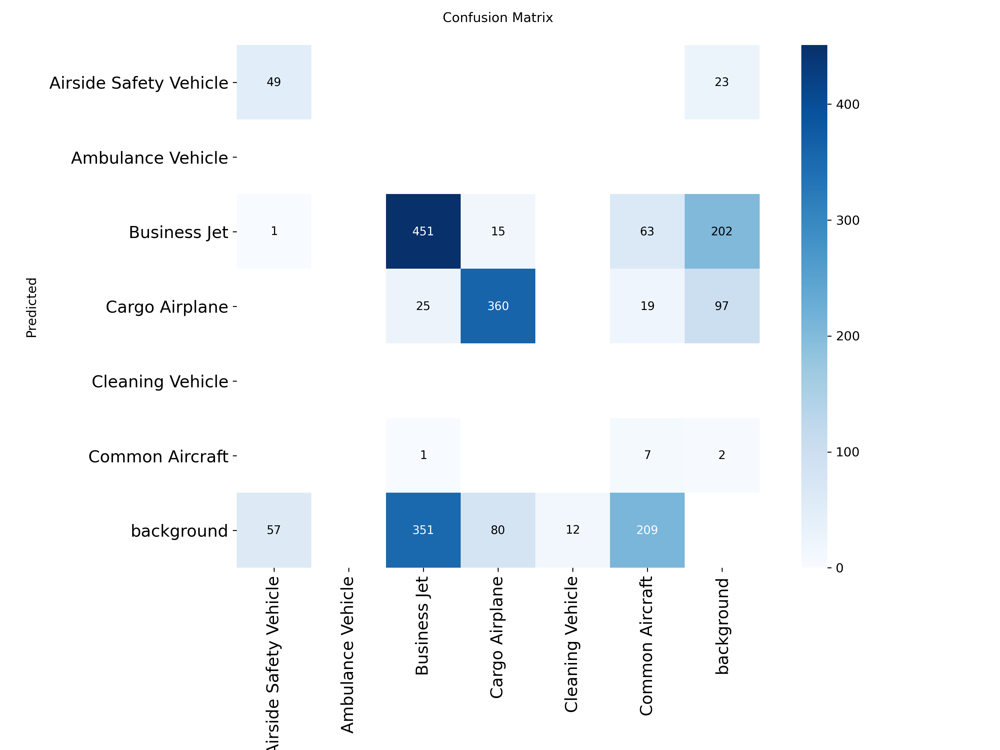

In [21]:
from PIL import Image
from IPython.display import display

img = Image.open("/kaggle/working/runs/detect/yolov8m_airport_model4/confusion_matrix.png")

# Display full-size image in notebook
display(img)


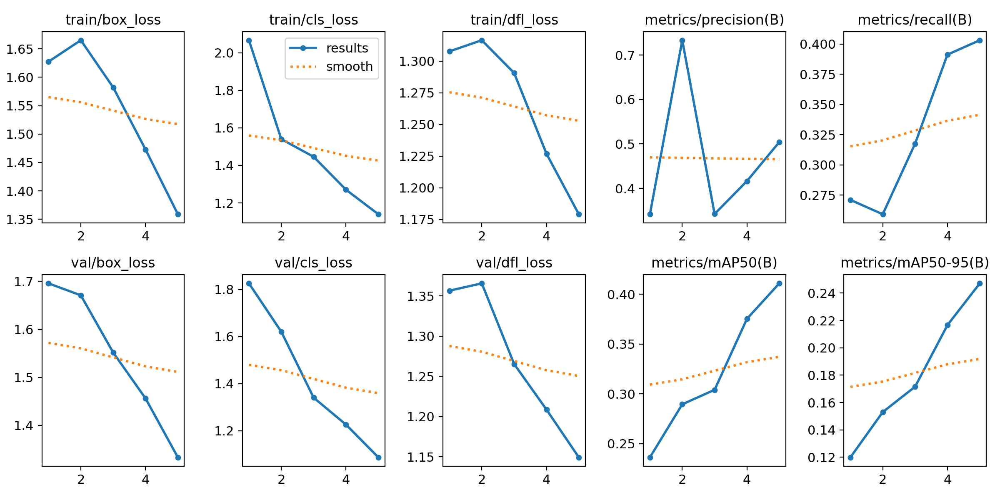

In [22]:
from PIL import Image
from IPython.display import display

img = Image.open("/kaggle/working/runs/detect/yolov8m_airport_model4/results.png")

# Display full-size image in notebook
display(img)


## New 6 clases

In [2]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 102.9 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 79.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.3 MB/s eta 0:00:00:00:0100:01


In [6]:
import os
import shutil
import csv
import random
from PIL import Image
from tqdm.notebook import tqdm

# --- Configuration ---
IMAGES_PATH = '/kaggle/input/airportvehicledataset/images'
BBOXES_PATH = '/kaggle/input/airportvehicledataset/bboxes'
YOLO_DATASET_PATH = '/kaggle/working/yolo_airport_dataset' # Final destination

# --- Final 6-class setup ---
# Original scattered class IDs → New 0..5 mapping
ID_MAP = {
    2: 0,   # Business Jet
    3: 1,   # Cargo Airplane
    7: 2,   # Container Trolley Type A
    22: 3,  # Person Wearing Reflective Vests
    27: 4,  # Standard Car
    39: 5   # Transport Container
}

# YOLO expects names as a list [0..N]
CLASS_NAMES = [
    'Business Jet',
    'Cargo Airplane',
    'Container Trolley Type A',
    'Person Wearing Reflective Vests',
    'Standard Car',
    'Transport Container'
]
NUM_CLASSES = len(CLASS_NAMES)

# --- Data Splitting & Conversion Logic ---

# Clean up any previous attempts
if os.path.exists(YOLO_DATASET_PATH):
    shutil.rmtree(YOLO_DATASET_PATH)

def process_data_split(image_filenames, data_split):
    images_dest_dir = os.path.join(YOLO_DATASET_PATH, 'images', data_split)
    labels_dest_dir = os.path.join(YOLO_DATASET_PATH, 'labels', data_split)
    os.makedirs(images_dest_dir, exist_ok=True)
    os.makedirs(labels_dest_dir, exist_ok=True)
    
    print(f"Processing {data_split} data...")
    for img_file in tqdm(image_filenames):
        # Copy the image file to the new directory
        shutil.copy(os.path.join(IMAGES_PATH, img_file), images_dest_dir)
        
        # Find the corresponding annotation file
        bbox_file = os.path.splitext(img_file)[0] + '.csv'
        bbox_path = os.path.join(BBOXES_PATH, bbox_file)
        
        if os.path.exists(bbox_path):
            try:
                # Get image dimensions for normalization
                with Image.open(os.path.join(IMAGES_PATH, img_file)) as img:
                    img_w, img_h = img.size
                
                # Read CSV and write to YOLO .txt format
                out_label_path = os.path.join(labels_dest_dir, os.path.splitext(img_file)[0] + '.txt')
                with open(bbox_path, 'r') as f_csv, open(out_label_path, 'w') as f_txt:
                    reader = csv.DictReader(f_csv)
                    for row in reader:
                        old_id = int(row['label'])
                        
                        # Remap class ID if it's in our target set
                        if old_id in ID_MAP:
                            class_id = ID_MAP[old_id]
                            x_min, y_min, x_max, y_max = float(row['tlx']), float(row['tly']), float(row['brx']), float(row['bry'])
                            
                            w, h = x_max - x_min, y_max - y_min
                            x_center = (x_min + w / 2) / img_w
                            y_center = (y_min + h / 2) / img_h
                            norm_w, norm_h = w / img_w, h / img_h
                            
                            f_txt.write(f"{class_id} {x_center} {y_center} {norm_w} {norm_h}\n")
                        # else:
                            # Skip any class not in our mapping
                            # print(f"⚠️ Skipping class {old_id} in {bbox_file} (not in ID_MAP)")
            except Exception as e:
                print(f"Skipping file {img_file} due to error: {e}")

# --- Split data ---
all_image_files = [f for f in os.listdir(IMAGES_PATH) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
random.seed(42)
random.shuffle(all_image_files)
split_index = int(len(all_image_files) * 0.9)
train_files = all_image_files[:split_index]
val_files = all_image_files[split_index:]

# --- Run conversion ---
process_data_split(train_files, 'train')
process_data_split(val_files, 'val')

print("\n✅ Conversion to YOLO format (with remapped IDs) is complete!")


Processing train data...


  0%|          | 0/7275 [00:00<?, ?it/s]

Processing val data...


  0%|          | 0/809 [00:00<?, ?it/s]


✅ Conversion to YOLO format (with remapped IDs) is complete!


In [7]:
import yaml

# --- Create the YAML Data Structure ---
data_yaml = {
    'path': '/kaggle/working/yolo_airport_dataset',
    'train': 'images/train',
    'val': 'images/val',
    'nc': len(CLASS_NAMES),
    'names': CLASS_NAMES
}

# --- Write the YAML File ---
yaml_path = '/kaggle/working/airport_dataset.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f, sort_keys=False)

print(f"Final dataset YAML file created at: {yaml_path} ✅")

Final dataset YAML file created at: /kaggle/working/airport_dataset.yaml ✅


In [7]:
from ultralytics import YOLO

# Load a pre-trained YOLOv8 model
model = YOLO('yolov8m.pt')

# Train the model on your custom data
results = model.train(
    data='/kaggle/working/airport_dataset.yaml',
    epochs=5,
    imgsz=640,
    batch=16,
    name='yolov8m_airport_model'
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/airport_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, ko

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687      0.752      0.553       0.61      0.381
          Business Jet        403        828      0.679      0.437      0.494      0.257
        Cargo Airplane        391        455      0.763      0.758      0.822      0.604
Container Trolley Type A        490       2394      0.689       0.46      0.541      0.278
Person Wearing Reflective Vests        289        911      0.802      0.593      0.627      0.347
          Standard Car        449        928      0.708      0.343      0.381       0.25
   Transport Container        506       2171       0.87      0.727      0.796      0.549
Speed: 0.2ms preprocess, 5.6ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/yolov8m_airport_model


In [11]:
from ultralytics import YOLO

# --- Load Your Trained Model ---
# The best model weights are saved in the 'runs/detect/yolov8m_airport_model/weights/' directory.
model_path = '/kaggle/working/runs/detect/yolov8m_airport_model/weights/best.pt'
model = YOLO(model_path)

# --- Run Validation ---
# This will evaluate the model on the 'val' set defined in your airport_dataset.yaml
print("Starting validation...")
metrics = model.val()

# Print the key metrics
print("\nValidation Metrics:")
print(f"Box mAP50-95: {metrics.box.map}")
print(f"Box mAP50: {metrics.box.map50}")

Starting validation...
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,843,234 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4284.4±883.8 MB/s, size: 800.3 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 36 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1279966.8it/s 0.0s.0s
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 3.4it/s 14.9s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687      0.754      0.554      0.611      0.382
          Business Jet        403        828      0.678      0.436      0.493      0.257
        Cargo Airplane        391        455      0.765      0.758      0.824      0.606
Container Trolley Type A        490       2394      0.689       0.46      0.541      0.279
Person Wearing Reflective Vests        289        911      0.813      0.596      0.631      0.349
          Standard Car        449        928       0.71      0.344      0.382      0.253
   Transport Container        506       2171      0.871      0.727      0.796       0.55
Speed: 0.4ms preprocess, 12.1ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/val

Validation Metrics:
Box mAP50-95: 0.3823279048449114
Box mAP50: 0.6110702091755985


In [13]:
from ultralytics import YOLO

# Load the pre-trained model
model = YOLO('yolov8m.pt')

# IMPORTANT: Replace these with the actual indices from your .yaml file!
class_indices_to_evaluate = [0, 1, 2, 3, 4, 5] 

# Get the class names from the model's names dictionary for a nice printout
# This assumes the dataset's names are loaded correctly with the model or dataset config
class_names_to_evaluate = [model.names[i] for i in class_indices_to_evaluate]
print(f"Starting validation on the following {len(class_names_to_evaluate)} classes: {class_names_to_evaluate}")

# Run validation focusing only on the specified classes
results = model.val(
    data='/kaggle/working/airport_dataset.yaml',
    imgsz=640,
    split='val',
    classes=class_indices_to_evaluate, # This is the key argument
    name='yolov8m_specific_class_eval'
)

# 'results' is the object returned by model.val() from the first code block

# Get the overall mean precision and mean recall
mean_precision = results.box.mp  # Mean Precision
mean_recall = results.box.mr     # Mean Recall

# Calculate the F1-Score using the formula
if (mean_precision + mean_recall) > 0:
    f1_score = 2 * (mean_precision * mean_recall) / (mean_precision + mean_recall)
else:
    f1_score = 0

print(f"Overall Mean Precision (P): {mean_precision:.4f}")
print(f"Overall Mean Recall (R): {mean_recall:.4f}")
print(f"Overall F1-Score: {f1_score:.4f}")

# You can also check the saved plot 'F1_curve.png' in your runs/detect/val folder

Starting validation on the following 6 classes: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus']
Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3554.3±503.5 MB/s, size: 601.2 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 36 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1459437.4it/s 0.0s.0s
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 3.7it/s 13.6s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687     0.0251      0.114     0.0202     0.0118
                person        403        828   0.000978     0.0205   0.000501   0.000232
               bicycle        391        455    0.00227     0.0022    0.00114   0.000227
                   car        490       2394     0.0199      0.249     0.0138     0.0051
            motorcycle        289        911     0.0216     0.0143     0.0112    0.00636
              airplane        449        928    0.00454     0.0593    0.00242    0.00125
                   bus        506       2171      0.101      0.338     0.0921     0.0574
Speed: 0.3ms preprocess, 12.4ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/yolov8m_specific_class_eval3
Overall Mean Precision (P): 0.0251
Overall Mean Recall (R): 0.1140
Overall F1-Score: 0.0411


In [6]:
# 'results' is the object returned by model.val() from the first code block

# Get the overall mean precision and mean recall
mean_precision = results.box.mp  # Mean Precision
mean_recall = results.box.mr     # Mean Recall

# Calculate the F1-Score using the formula
if (mean_precision + mean_recall) > 0:
    f1_score = 2 * (mean_precision * mean_recall) / (mean_precision + mean_recall)
else:
    f1_score = 0

print(f"Overall Mean Precision (P): {mean_precision:.4f}")
print(f"Overall Mean Recall (R): {mean_recall:.4f}")
print(f"Overall F1-Score: {f1_score:.4f}")

# You can also check the saved plot 'F1_curve.png' in your runs/detect/val folder

Overall Mean Precision (P): 0.0251
Overall Mean Recall (R): 0.1140
Overall F1-Score: 0.0411


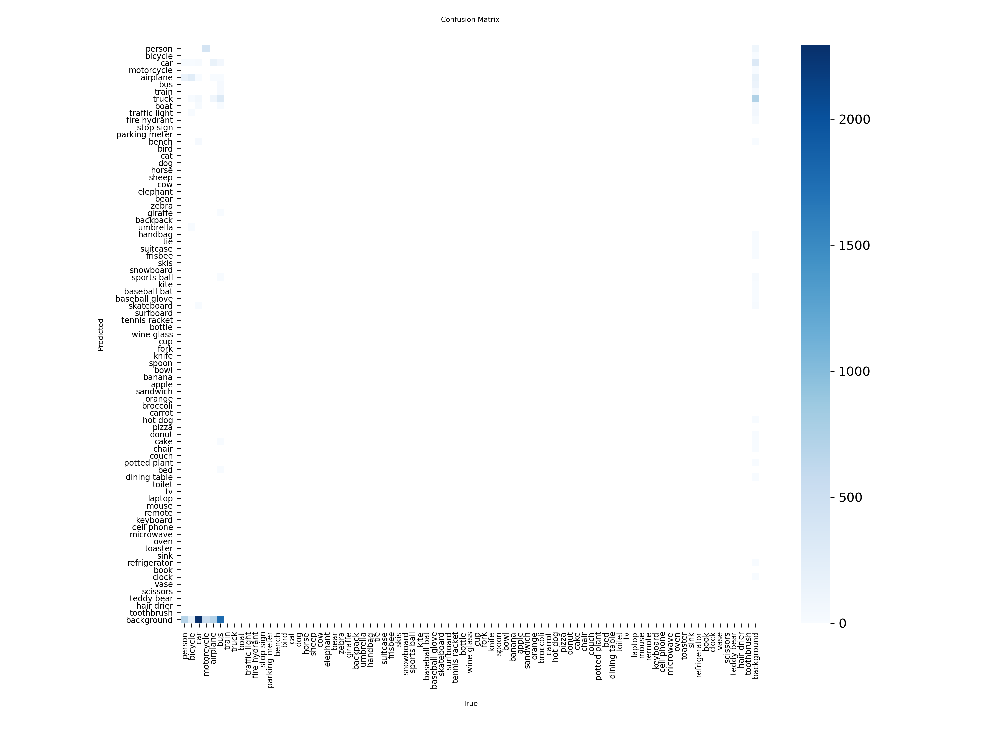

In [9]:
from PIL import Image
from IPython.display import display

img = Image.open("/kaggle/working/runs/detect/yolov8m_specific_class_eval/confusion_matrix.png")

# Display full-size image in notebook
display(img)


Ultralytics 8.3.189 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2600.8±274.4 MB/s, size: 491.4 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 36 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1227194.2it/s 0.0s0s
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 3.8it/s 13.3s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687     0.0251      0.114     0.0202     0.0118
                person        403        828   0.000978     0.0205   0.000501   0.000232
               bicycle        391        455    0.00227     0.0022    0.00114   0.000227
                   car        490       2394     0.0199      0.249     0.0138     0.0051
            motorcycle        289        911     0.0216     0.0143     0.0112    0.00636
              airplane        449        928    0.00454     0.0593    0.00242    0.00125
                   bus        506       2171      0.101      0.338     0.0921     0.0574
Speed: 0.3ms preprocess, 12.2ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/yolov8m_specific_class_eval2


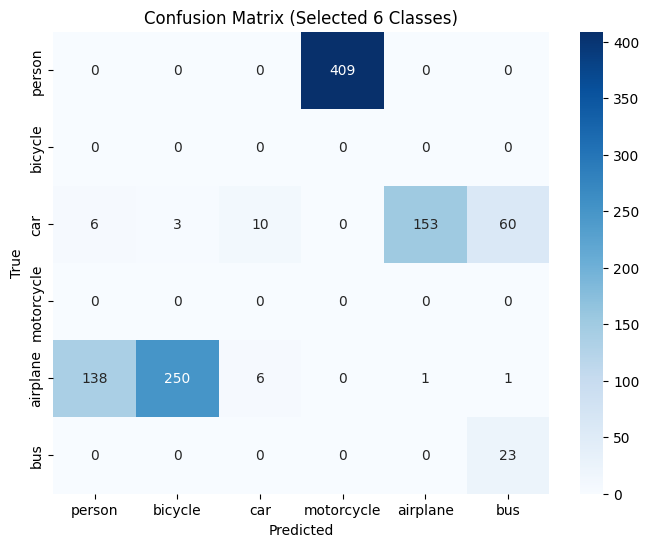

In [10]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the pre-trained model
model = YOLO('yolov8m.pt')
# Run validation
results = model.val(
    data='/kaggle/working/airport_dataset.yaml',
    imgsz=640,
    split='val',
    classes=[0,1,2,3,4,5],
    name='yolov8m_specific_class_eval'
)

# Get full confusion matrix
cm = results.confusion_matrix.matrix  # shape: (num_classes, num_classes)

# Pick only your 6 classes
subset_idx = [0,1,2,3,4,5]
cm_subset = cm[np.ix_(subset_idx, subset_idx)]

# Pretty print
class_names = [model.names[i] for i in subset_idx]

plt.figure(figsize=(8,6))
sns.heatmap(cm_subset, annot=True, fmt="g", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Selected 6 Classes)")
plt.show()


In [3]:
!pip install ultralytics -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 15.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 73.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.4 MB/s eta 0:00:00:00:0100:01


Loading pre-trained detection model: yolov8m.pt...
Starting detection evaluation on the validation dataset...
Ultralytics 8.3.192 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3170.4±323.9 MB/s, size: 619.3 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val... 809 images, 36 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1327.5it/s 0.6s0.0s
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/yolo_airport_dataset/labels/val.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 3.5it/s 14.6s0.3s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687     0.0251      0.114     0.0202     0.0118
                person        403        828   0.000978     0.0205   0.000501   0.000232
               bicycle        391        455    0.00227     0.0022    0.00114   0.000227
                   car        490       2394     0.0199      0.249     0.0138     0.0051
            motorcycle        289        911     0.0216     0.0143     0.0112    0.00636
              airplane        449        928    0.00454     0.0593    0.00242    0.00125
                   bus        506       2171      0.101      0.338     0.0921     0.0574
Speed: 0.2ms preprocess, 12.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to YOLOv8_Detection_Evaluation/evaluation_results

--- Evaluation Complete ---
Object detection metrics (like mAP) have been printed above.
Displaying confusion matrix from: YOLOv8_Detection_Evaluation/evaluation_results/confusion_matrix.png


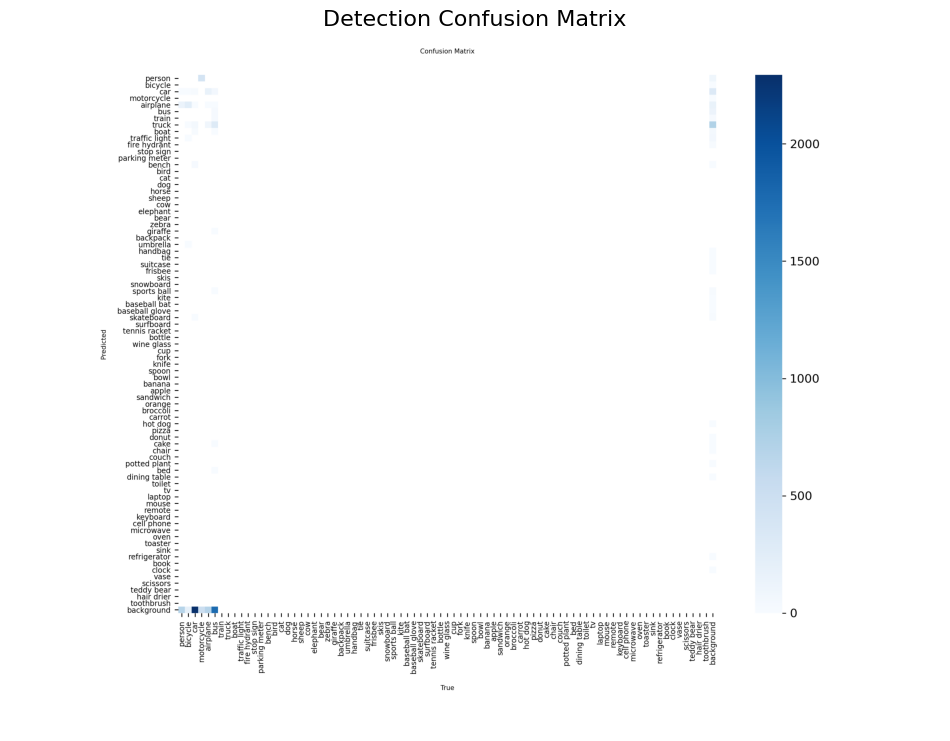

In [9]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ultralytics import YOLO

# --- Configuration ---
# Path to the dataset configuration YAML file for DETECTION
DATASET_YAML_PATH = '/kaggle/working/airport_dataset.yaml'

# Use a pre-trained OBJECT DETECTION model (e.g., yolov8n.pt, yolov8m.pt)
# Note: We are NOT using a '-cls' model anymore.
MODEL_NAME = 'yolov8m.pt'

# Directory to save the results
PROJECT_NAME = 'YOLOv8_Detection_Evaluation'

def evaluate_detection_model():
    """
    Loads a pre-trained YOLOv8 detection model and evaluates it on the
    validation set. It will calculate mAP, and generate plots like the
    confusion matrix.
    """
    print(f"Loading pre-trained detection model: {MODEL_NAME}...")
    try:
        # Load a pre-trained YOLOv8 object detection model
        model = YOLO(MODEL_NAME)
    except Exception as e:
        print(f"Error loading model: {e}")
        print("Please ensure you have an internet connection to download the model.")
        return

    print("Starting detection evaluation on the validation dataset...")
    try:
        # Evaluate the model's performance on the validation set for the DETECTION task.
        # This will save results, including the confusion matrix, to the project directory.
        metrics = model.val(data=DATASET_YAML_PATH,
                            project=PROJECT_NAME,
                            name='evaluation_results',
                            split='val')
    except Exception as e:
        print(f"An error occurred during validation: {e}")
        print("Please check your YAML file paths and dataset structure.")
        return

    # The key metrics like mAP50-95 are automatically printed to the console.
    print("\n--- Evaluation Complete ---")
    print("Object detection metrics (like mAP) have been printed above.")

    # --- Find and Display the Confusion Matrix ---
    results_dir = os.path.join(PROJECT_NAME, 'evaluation_results')
    confusion_matrix_path = os.path.join(results_dir, 'confusion_matrix.png')

    if os.path.exists(confusion_matrix_path):
        print(f"Displaying confusion matrix from: {confusion_matrix_path}")
        try:
            img = mpimg.imread(confusion_matrix_path)
            plt.figure(figsize=(12, 10))
            plt.imshow(img)
            plt.axis('off')
            plt.title('Detection Confusion Matrix', fontsize=16)
            plt.show()
        except Exception as e:
            print(f"Could not display the confusion matrix image. Error: {e}")
    else:
        print(f"Confusion matrix not found at: {confusion_matrix_path}")
        print("Please check the output directory for generated plots.")

if __name__ == '__main__':
    if not os.path.exists(DATASET_YAML_PATH):
        print(f"Error: Dataset config file not found at '{DATASET_YAML_PATH}'")
    else:
        evaluate_detection_model()


Loading custom class names from YAML...
Loading pre-trained model: yolov8m.pt...
Running validation, focusing on your 6 classes...
Ultralytics 8.3.192 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,886,080 parameters, 0 gradients, 78.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4001.6±883.8 MB/s, size: 556.0 KB)
val: Scanning /kaggle/working/yolo_airport_dataset/labels/val.cache... 809 images, 36 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 809/809 1790602.6it/s 0.0s.0s
val: /kaggle/working/yolo_airport_dataset/images/val/aut-0941-00000173.jpg: 1 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 51/51 3.6it/s 14.1s0.3s


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        809       7687     0.0251      0.114     0.0202     0.0118
                person        403        828   0.000978     0.0205   0.000501   0.000232
               bicycle        391        455    0.00227     0.0022    0.00114   0.000227
                   car        490       2394     0.0199      0.249     0.0138     0.0051
            motorcycle        289        911     0.0216     0.0143     0.0112    0.00636
              airplane        449        928    0.00454     0.0593    0.00242    0.00125
                   bus        506       2171      0.101      0.338     0.0921     0.0574
Speed: 0.3ms preprocess, 13.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to YOLOv8_Final_Evaluation/focused_evaluation_run
Generating the final confusion matrix plot...


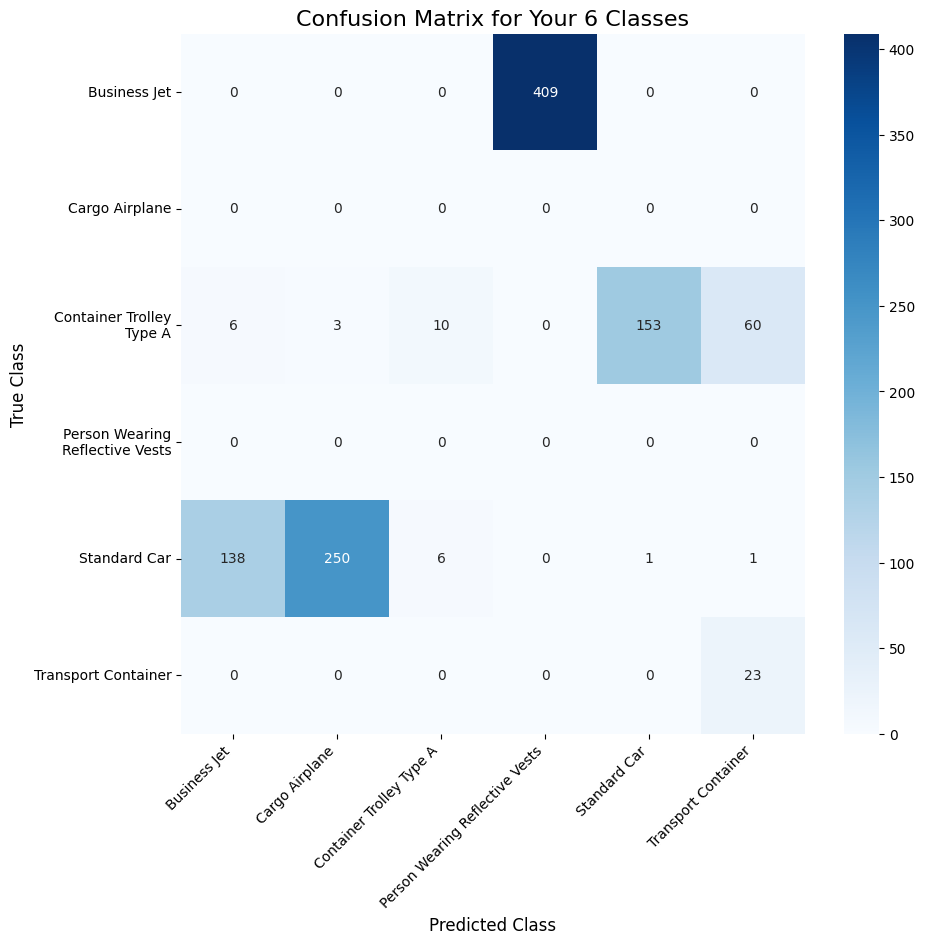

In [19]:
import yaml
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import textwrap
from ultralytics import YOLO

# --- Configuration ---
MODEL_PATH = 'yolov8m.pt'
DATASET_YAML = '/kaggle/working/airport_dataset.yaml'
PROJECT_NAME = 'YOLOv8_Final_Evaluation'

def create_final_confusion_matrix():
    """
    Runs YOLOv8 validation on a specific subset of classes and generates a
    correctly labeled confusion matrix.
    """
    # --- 1. Load your custom class names from the YAML file ---
    print("Loading custom class names from YAML...")
    try:
        with open(DATASET_YAML, 'r') as f:
            dataset_info = yaml.safe_load(f)
            your_class_names = dataset_info['names']
            num_classes = len(your_class_names)
            class_indices = list(range(num_classes))
            if num_classes != 6:
                print(f"Warning: Expected 6 classes, but found {num_classes} in {DATASET_YAML}.")
    except Exception as e:
        print(f"Error loading or parsing {DATASET_YAML}: {e}")
        return

    # --- 2. Load the pre-trained model ---
    print(f"Loading pre-trained model: {MODEL_PATH}...")
    model = YOLO(MODEL_PATH)

    # --- 3. Run validation focused ONLY on your classes ---
    # This is the key step guided by your provided code.
    print(f"Running validation, focusing on your {num_classes} classes...")
    results = model.val(
        data=DATASET_YAML,
        imgsz=640,
        split='val',
        project=PROJECT_NAME,
        name='focused_evaluation_run',
        classes=class_indices  # Tell YOLO to only evaluate these classes
    )

    # --- 4. Get the resulting confusion matrix ---
    # The matrix will now be correctly sized for your classes + background.
    confusion_matrix = results.confusion_matrix.matrix
    
    # The matrix includes a background class, so we select the part for your classes.
    cm_subset = confusion_matrix[:num_classes, :num_classes]

    # --- 5. Plot the final, correctly labeled matrix ---
    print("Generating the final confusion matrix plot...")
    
    fig, ax = plt.subplots(figsize=(12, 10))
    
    sns.heatmap(
        cm_subset,
        annot=True,
        fmt="g",
        cmap="Blues",
        ax=ax
    )
    
    ax.set_xlabel("Predicted Class", fontsize=12)
    ax.set_ylabel("True Class", fontsize=12)
    ax.set_title("Confusion Matrix for Your 6 Classes", fontsize=16)

    # Explicitly set the ticks and labels for both axes
    ax.set_xticks(np.arange(num_classes) + 0.5)
    ax.set_xticklabels(your_class_names, rotation=45, ha="right")
    
    # Wrap long y-axis labels
    wrapped_yticklabels = [textwrap.fill(label, 20) for label in your_class_names]
    ax.set_yticks(np.arange(num_classes) + 0.5)
    ax.set_yticklabels(wrapped_yticklabels, rotation=0, va="center")
    
    # Manually adjust subplot parameters to ensure everything fits
    plt.subplots_adjust(left=0.3, bottom=0.2, right=0.95, top=0.9)
    plt.show()


if __name__ == '__main__':
    create_final_confusion_matrix()

